In [4715]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [4716]:
np.random.seed(42)

In [4717]:
cluster_generator = CorrelatedClusterGenerator(n_samples=5000,n_features=10,n_clusters=3,correlation=0.5,random_state=42)

In [4718]:
X, y = cluster_generator.generate_clusters()

In [4719]:
X = X + np.random.normal(scale=6,size=X.shape) 

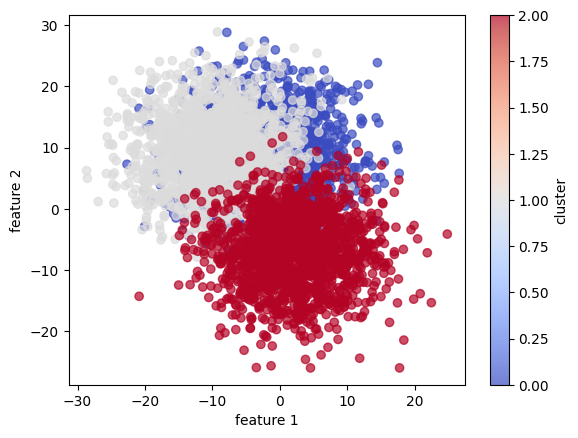

In [4720]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

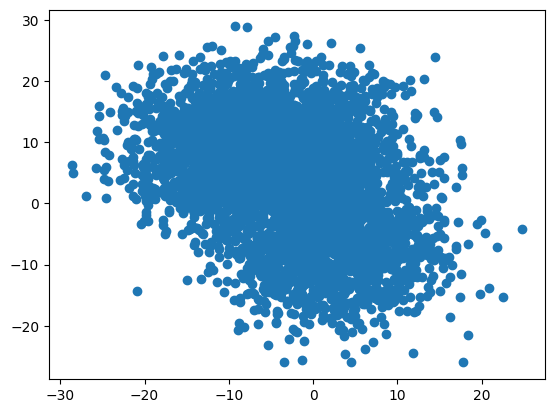

In [4721]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [4722]:
corr_dataset = pd.DataFrame(X) 

In [4723]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [4724]:
corr_dataset['target'] = y

In [4725]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0
...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2


In [4726]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [4727]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10
vab_1,1.000000,-0.383793,-0.343455,0.139752,0.216802,0.328916,-0.090390,0.012839,0.155536,-0.106862
vab_2,-0.383793,1.000000,0.488624,0.039884,-0.313182,-0.528228,-0.005048,0.194030,-0.091537,0.419278
vab_3,-0.343455,0.488624,1.000000,-0.015272,-0.232912,-0.386767,0.020791,0.101156,-0.091411,0.280647
vab_4,0.139752,0.039884,-0.015272,1.000000,-0.006148,-0.036006,-0.145607,0.199238,0.118747,0.236640
vab_5,0.216802,-0.313182,-0.232912,-0.006148,1.000000,0.295387,0.017088,-0.105019,0.044372,-0.225534
vab_6,0.328916,-0.528228,-0.386767,-0.036006,0.295387,1.000000,0.032180,-0.165901,0.090463,-0.371785
vab_7,-0.090390,-0.005048,0.020791,-0.145607,0.017088,0.032180,1.000000,-0.116623,-0.068809,-0.145242
vab_8,0.012839,0.194030,0.101156,0.199238,-0.105019,-0.165901,-0.116623,1.000000,0.092709,0.307318
vab_9,0.155536,-0.091537,-0.091411,0.118747,0.044372,0.090463,-0.068809,0.092709,1.000000,0.045018
vab_10,-0.106862,0.419278,0.280647,0.236640,-0.225534,-0.371785,-0.145242,0.307318,0.045018,1.000000


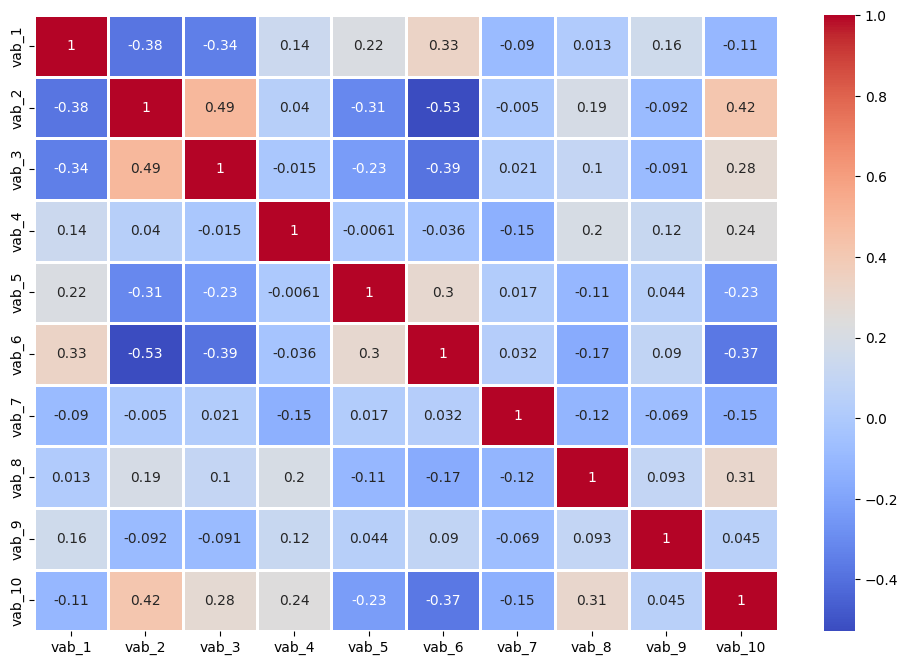

In [4728]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='coolwarm',annot=True,linewidths=1)
plt.show()

## data standardization

In [4729]:
X_values = corr_dataset.iloc[:,:-1].values

In [4730]:
y_values = corr_dataset.iloc[:,-1].values

In [4731]:
scaler = StandardScaler()

In [4732]:
X_values = scaler.fit_transform(X_values)

In [4733]:
np.mean(X_values),np.std(X_values)

(1.2112493214637962e-16, 1.0000000000000007)

In [4734]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9
0,0.083771,0.762698,0.982149,0.828465,-0.064388,-0.609870,-0.042750,0.590374,2.202566,1.427214
1,0.244982,0.206088,-0.026134,1.911782,-2.720859,-0.443975,-0.271791,1.373395,0.522436,1.810748
2,0.108201,0.528870,0.879668,1.708188,0.072138,0.120527,-0.650021,0.750283,1.520811,1.097797
3,0.212501,0.670753,1.171150,1.772910,-1.051874,-0.198974,-0.407741,0.433106,1.448134,0.511784
4,-0.433225,0.069270,0.101148,-0.032038,-1.250635,-1.262584,-1.285047,0.130787,0.436758,-0.663025
...,...,...,...,...,...,...,...,...,...,...
4993,0.877460,-0.909237,-0.663614,0.074546,0.795359,0.939913,-1.707635,2.277564,0.704885,0.623003
4994,0.763538,-0.702448,-2.155022,1.431109,1.973268,0.389565,-0.524737,-0.504889,0.530284,-0.962982
4995,1.327373,-0.971064,-0.662856,0.002503,2.029106,1.737731,-0.077163,0.663903,-0.366272,-0.975566
4996,1.620043,-0.694913,-0.437160,0.268634,2.138310,0.935961,0.184817,0.899867,-0.798124,-0.969175


<Axes: ylabel='Density'>

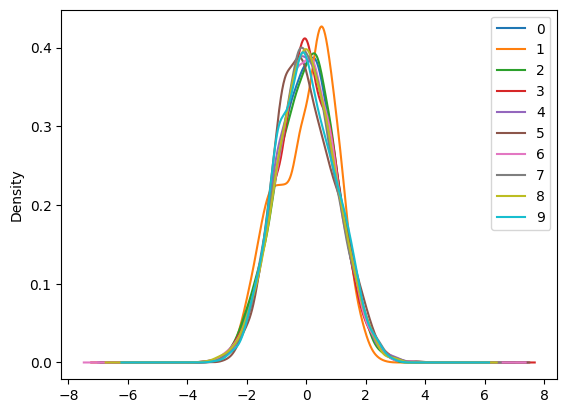

In [4735]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [4736]:
pca_general = PCA()

In [4737]:
pca_general.fit(X_values)

PCA()

In [4738]:
explained_variance = pca_general.explained_variance_ratio_

In [4739]:
explained_variance

array([0.27827   , 0.16047852, 0.09226456, 0.08687063, 0.08022177,
       0.07746632, 0.06589366, 0.06099199, 0.05438063, 0.04316193])

In [4740]:
eigenvalues = pca_general.explained_variance_

In [4741]:
pd.DataFrame(eigenvalues)

,0
0,2.783257
1,1.605106
2,0.922830
3,0.868880
4,0.802378
5,0.774818
6,0.659068
7,0.610042
8,0.543915
9,0.431706


In [4742]:
eigenvectors = pca_general.components_

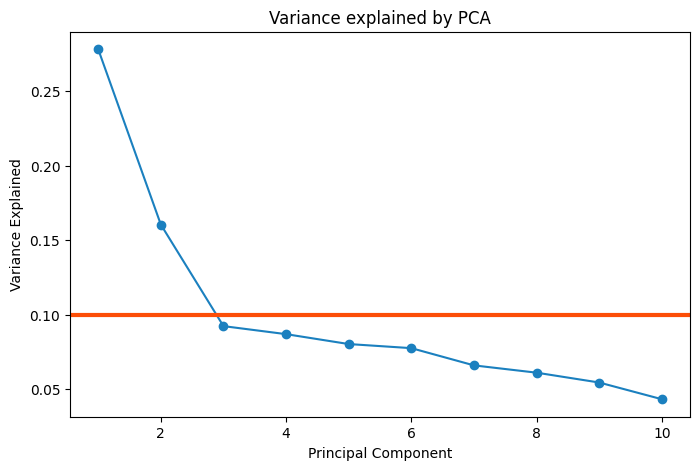

In [4743]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [4744]:
pca = PCA(n_components=2)

In [4745]:
principal_components = pca.fit_transform(X_values)

In [4746]:
pd.DataFrame(principal_components).head(8)

,0,1
0,1.571415,1.809320
1,2.110731,2.427433
2,1.078823,2.271333
3,1.444901,1.787274
4,0.962523,0.198363
5,2.042814,1.792036
6,0.459551,3.109057
7,1.717599,0.040910


In [4747]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2'])

In [4748]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [4749]:
final_df

,principal component 1,principal component 2,target
0,1.571415,1.809320,0
1,2.110731,2.427433,0
2,1.078823,2.271333,0
3,1.444901,1.787274,0
4,0.962523,0.198363,0
...,...,...,...
4993,-0.956983,2.650121,2
4994,-2.658858,1.315186,2
4995,-2.786624,0.623032,2
4996,-2.239827,0.641696,2


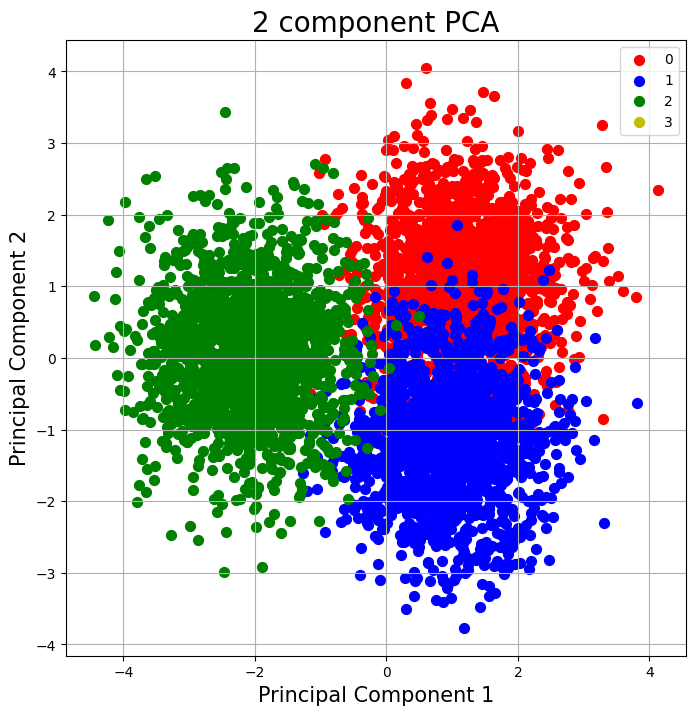

In [4750]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

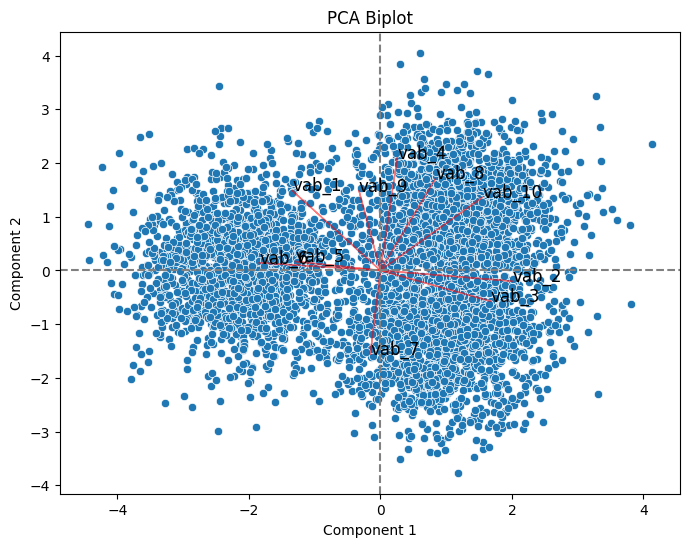

In [4751]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

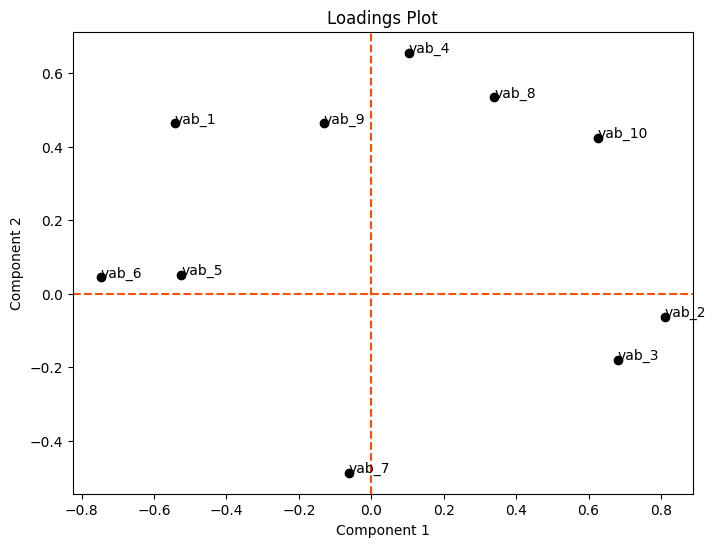

In [4752]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [4753]:
X_pca = pca.transform(X_values)

In [4754]:
pd.DataFrame(X_pca).head()

,0,1
0,1.571415,1.809320
1,2.110731,2.427433
2,1.078823,2.271333
3,1.444901,1.787274
4,0.962523,0.198363


## t-SNE

In [4755]:
tsne = TSNE(n_components=2,random_state=42)

In [4756]:
X_tsne = tsne.fit_transform(X_values)

In [4757]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [4758]:
tsne_data

,dim_1,dim_2,target
0,30.145515,44.456089,0
1,49.554680,15.906936,0
2,25.679163,39.754776,0
3,29.649240,30.933460,0
4,8.513361,-4.716121,0
...,...,...,...
4993,8.582240,44.398350,2
4994,-42.491432,29.289043,2
4995,-50.998222,11.729615,2
4996,-51.056080,11.745270,2


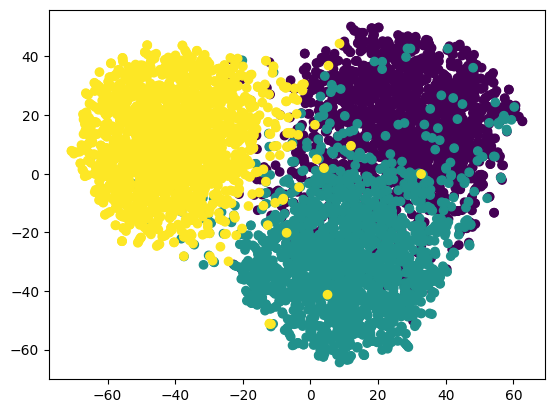

In [4759]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [4760]:
tsne.kl_divergence_

2.5611133575439453

## umap

In [4761]:
umap = umap.UMAP(random_state=42)

In [4762]:
X_umap = umap.fit_transform(X_values)

In [4763]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [4764]:
umap_data

,dim_1,dim_2,target
0,9.548823,8.365323,0
1,7.929666,8.145823,0
2,9.237010,8.632240,0
3,9.145411,8.160556,0
4,7.131556,6.029738,0
...,...,...,...
4993,6.929785,8.986315,2
4994,1.222668,5.307068,2
4995,1.383492,4.416021,2
4996,1.674315,4.439913,2


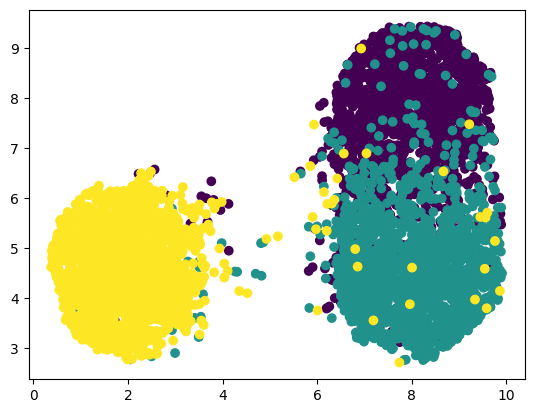

In [4765]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [4766]:
kmeans = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [4767]:
kmeans.fit(X_values)

KMeans(n_clusters=3, random_state=42)

In [4768]:
df_kmeans = corr_dataset.copy()

In [4769]:
df_kmeans['k_means'] = kmeans.labels_

In [4770]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4771]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.04441776710684274
accuracy after: 0.9163665466186475


In [4772]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


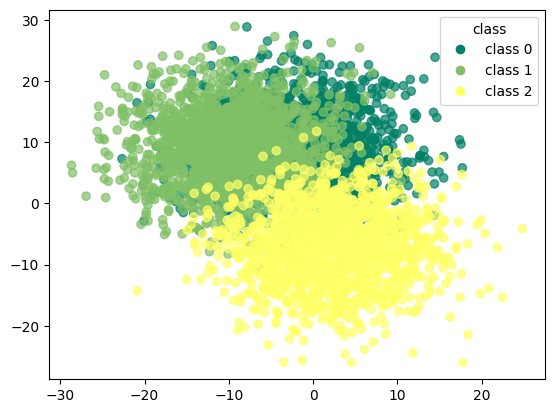

In [4773]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

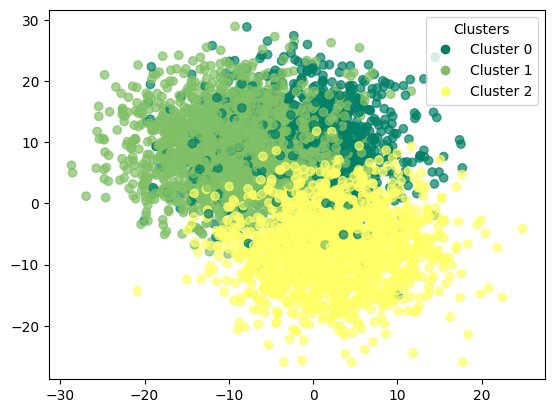

In [4774]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4775]:
kmeans.cluster_centers_

array([[-0.79593798,  0.56185582,  0.57368214, -0.59358942, -0.27373829,
        -0.45042916,  0.39584681, -0.33380123, -0.46074175, -0.12079305],
       [ 0.70634895, -1.11064675, -0.85537758, -0.08544076,  0.60292294,
         0.97007419,  0.04871781, -0.37613834,  0.17033138, -0.76396504],
       [ 0.10852542,  0.52770896,  0.26368209,  0.68543542, -0.3181343 ,
        -0.50173953, -0.4489402 ,  0.7094059 ,  0.29836508,  0.87665088]])

In [4776]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1480  178    8]
 [ 163 1483   20]
 [  24   25 1617]]


In [4777]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.89      0.89      0.89      1666
           1       0.88      0.89      0.88      1666
           2       0.98      0.97      0.98      1666

    accuracy                           0.92      4998
   macro avg       0.92      0.92      0.92      4998
weighted avg       0.92      0.92      0.92      4998



### k-means with pca

In [4778]:
kmeans_pca = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [4779]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=3, random_state=42)

In [4780]:
df_pca_kmeans = corr_dataset.copy()

In [4781]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [4782]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,kmeans_pca
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4783]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.04801920768307323
accuracy after: 0.9109643857543017


In [4784]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,kmeans_pca
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


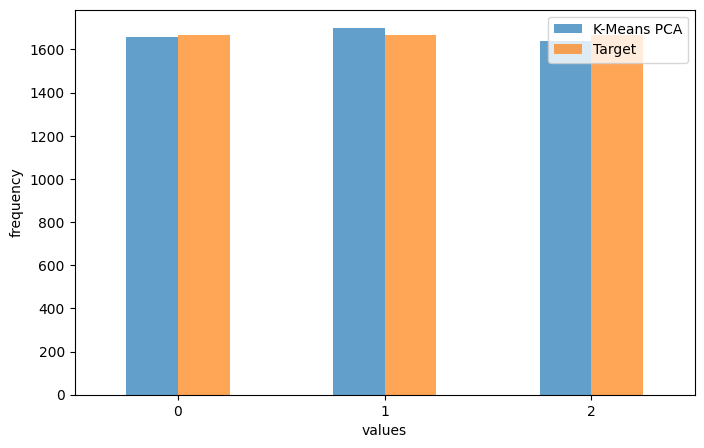

In [4785]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [4786]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1465  193    8]
 [ 168 1477   21]
 [  26   29 1611]]


In [4787]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.88      0.88      0.88      1666
           1       0.87      0.89      0.88      1666
           2       0.98      0.97      0.97      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



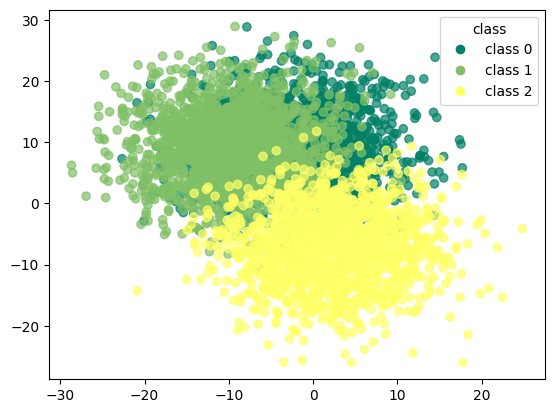

In [4788]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

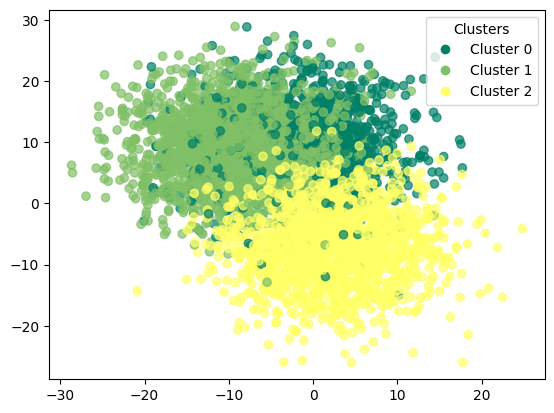

In [4789]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

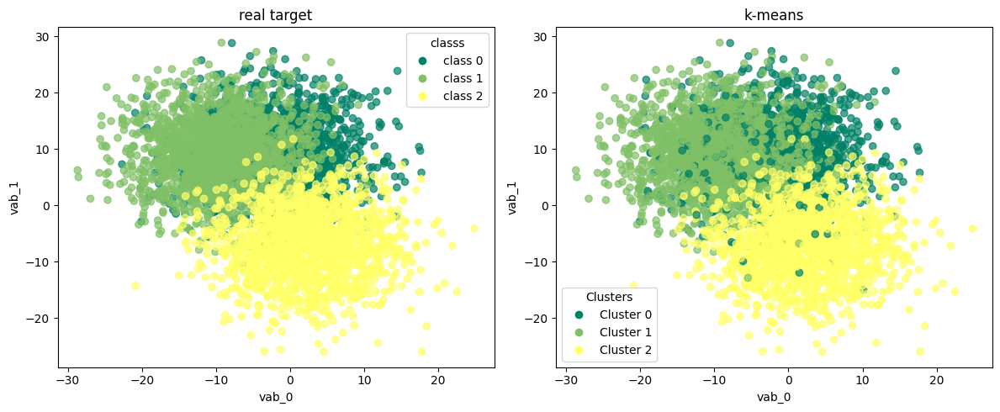

In [4790]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

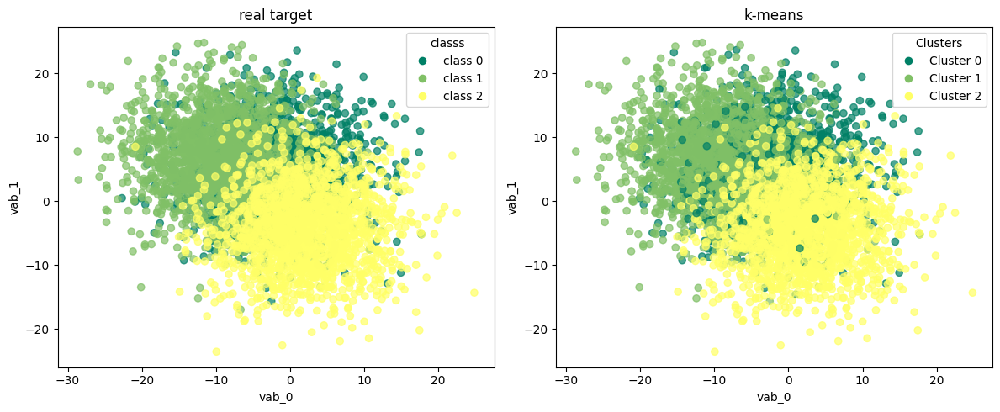

In [4791]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

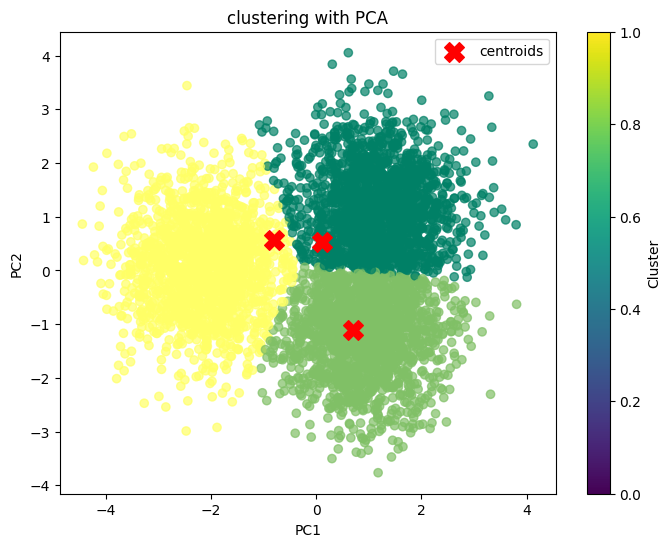

In [4792]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

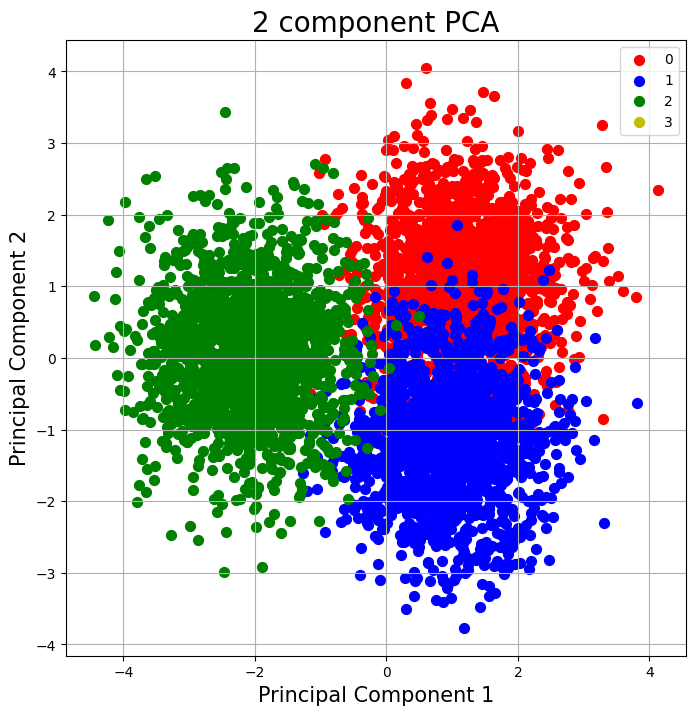

In [4793]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [4794]:
kmeans_tsne = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [4795]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=3, random_state=42)

In [4796]:
df_tsne_kmeans = corr_dataset.copy()

In [4797]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [4798]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,kmeans_tsne
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4799]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.043817527010804325
accuracy after: 0.9051620648259304


In [4800]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,kmeans_tsne
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


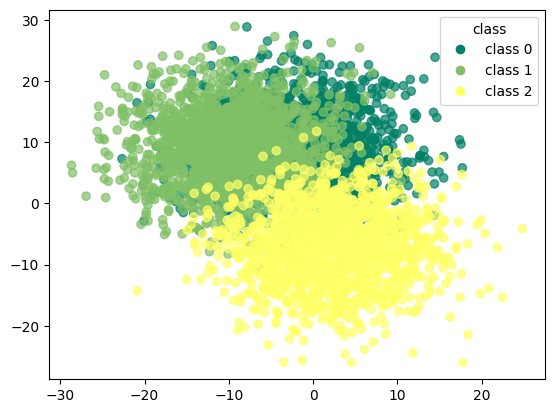

In [4801]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

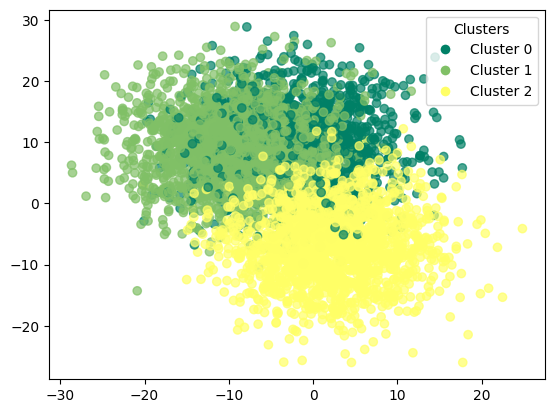

In [4802]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

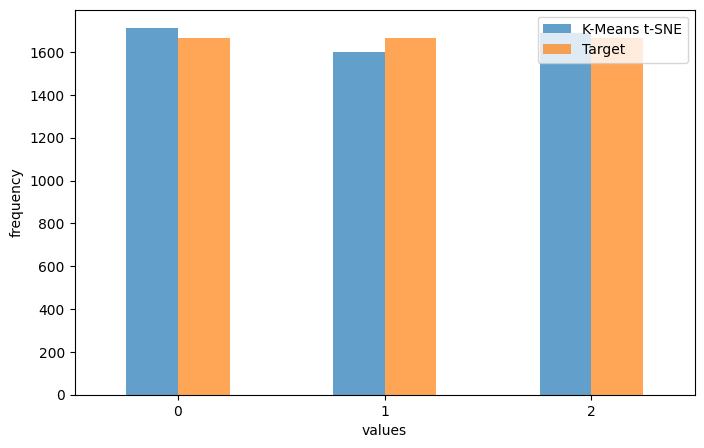

In [4803]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [4804]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1478  158   30]
 [ 208 1423   35]
 [  26   17 1623]]


In [4805]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      1666
           1       0.89      0.85      0.87      1666
           2       0.96      0.97      0.97      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.90      4998
weighted avg       0.91      0.91      0.90      4998



### k-means with umap

In [4806]:
kmeans_umap = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [4807]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=3, random_state=42)

In [4808]:
df_umap_kmeans = corr_dataset.copy()

In [4809]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [4810]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,kmeans_umap
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4811]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.05002000800320128
accuracy after: 0.9117647058823529


In [4812]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,kmeans_umap
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


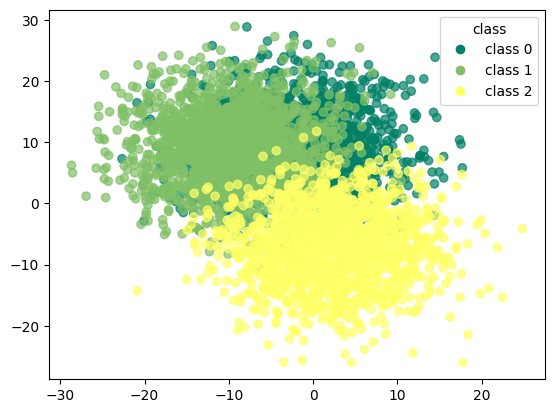

In [4813]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

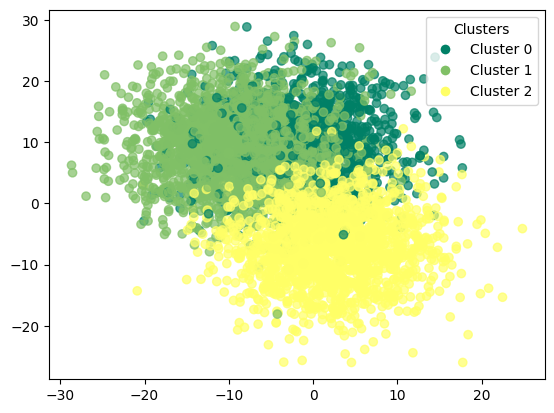

In [4814]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

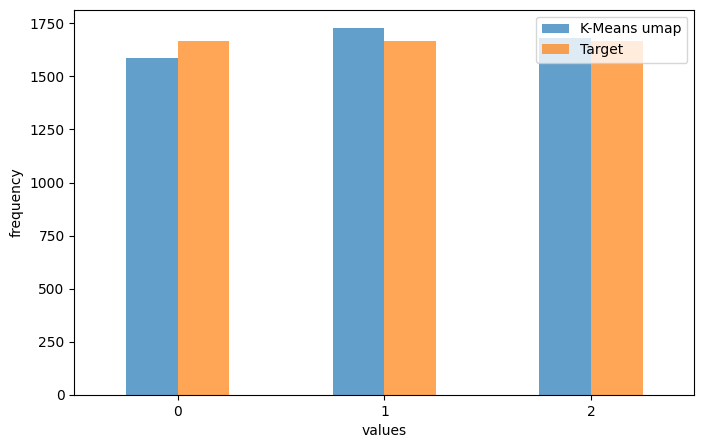

In [4815]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [4816]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1432  214   20]
 [ 148 1491   27]
 [   9   23 1634]]


In [4817]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.90      0.86      0.88      1666
           1       0.86      0.89      0.88      1666
           2       0.97      0.98      0.98      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



## trimmed k-means

In [4818]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [4819]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=3,trim_fraction=0.1)

In [4820]:
trimmed_kmeans

KMeans(n_clusters=3, random_state=42)

In [4821]:
df_trim_kmeans = corr_dataset.copy()

In [4822]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [4823]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [4824]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,trim_kmeans
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
4991,7.997058,-0.009597,-12.698954,-2.103089,-3.100514,-7.522357,-8.459241,-2.840458,-2.000569,1.452409,2,1
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4825]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.0426856380613606
accuracy after: 0.917741218319253


In [4826]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,trim_kmeans
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4991,7.997058,-0.009597,-12.698954,-2.103089,-3.100514,-7.522357,-8.459241,-2.840458,-2.000569,1.452409,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


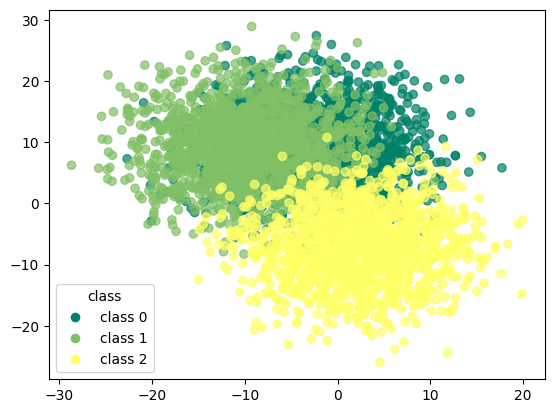

In [4827]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

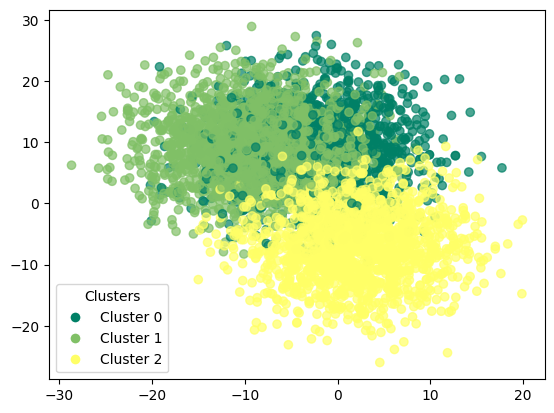

In [4828]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4829]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1326  158    7]
 [ 156 1345   17]
 [  17   15 1457]]


In [4830]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.88      0.89      0.89      1491
           1       0.89      0.89      0.89      1518
           2       0.98      0.98      0.98      1489

    accuracy                           0.92      4498
   macro avg       0.92      0.92      0.92      4498
weighted avg       0.92      0.92      0.92      4498



### trimmed k-means with pca

In [4831]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=3,trim_fraction=0.1)

In [4832]:
trim_kmeans_pca

KMeans(n_clusters=3, random_state=42)

In [4833]:
df_pca_trim_kmeans = corr_dataset.copy()

In [4834]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [4835]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [4836]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,trim_kmeans_pca
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
4991,7.997058,-0.009597,-12.698954,-2.103089,-3.100514,-7.522357,-8.459241,-2.840458,-2.000569,1.452409,2,1
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4837]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.04490884837705647
accuracy after: 0.8986216096042685


In [4838]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,trim_kmeans_pca
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4991,7.997058,-0.009597,-12.698954,-2.103089,-3.100514,-7.522357,-8.459241,-2.840458,-2.000569,1.452409,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


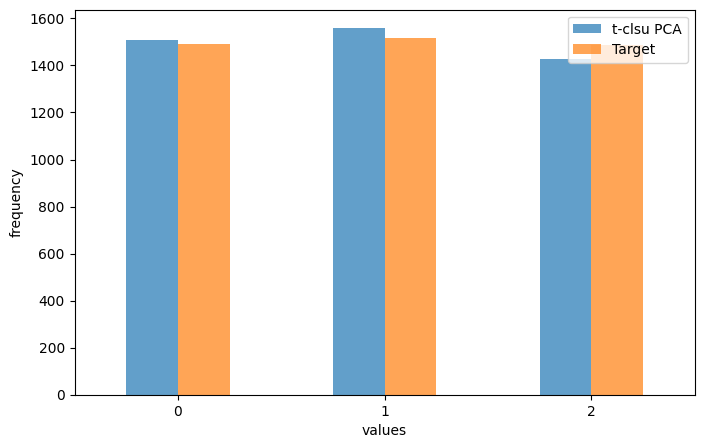

In [4839]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [4840]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1310  178    3]
 [ 188 1318   12]
 [  12   63 1414]]


In [4841]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.87      0.88      0.87      1491
           1       0.85      0.87      0.86      1518
           2       0.99      0.95      0.97      1489

    accuracy                           0.90      4498
   macro avg       0.90      0.90      0.90      4498
weighted avg       0.90      0.90      0.90      4498



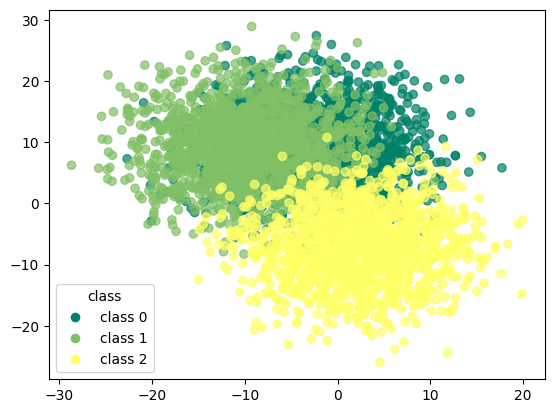

In [4842]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

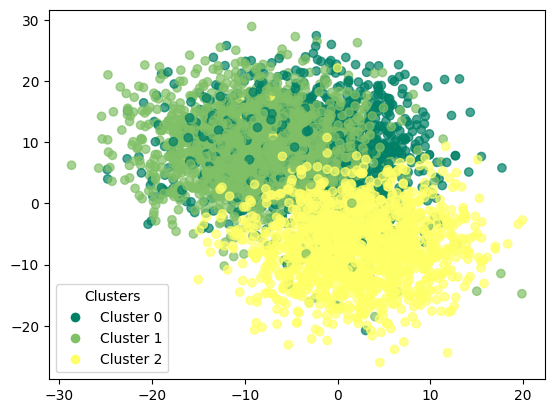

In [4843]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

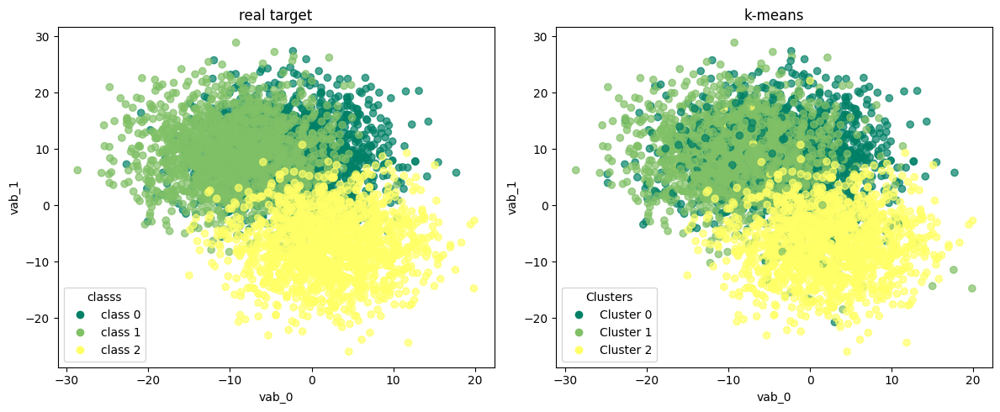

In [4844]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

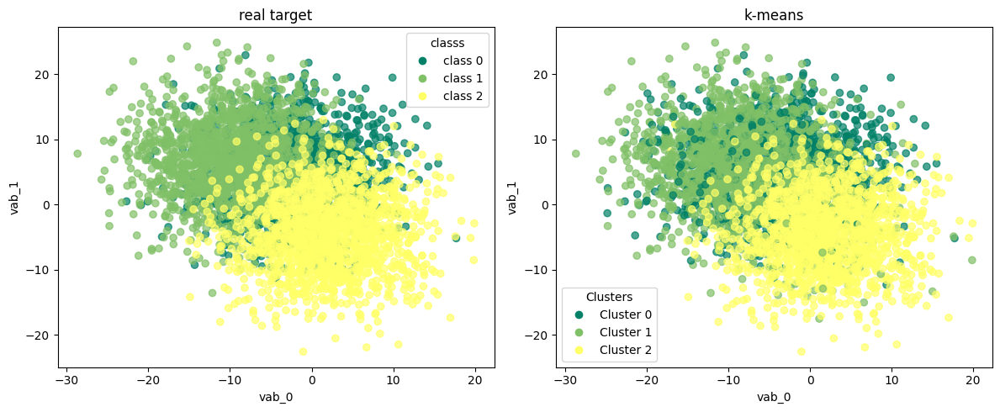

In [4845]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [4846]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=3,trim_fraction=0.1)

In [4847]:
trim_kmeans_tsne

KMeans(n_clusters=3, random_state=42)

In [4848]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [4849]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [4850]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [4851]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,trim_kmeans_tsne
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4991,7.997058,-0.009597,-12.698954,-2.103089,-3.100514,-7.522357,-8.459241,-2.840458,-2.000569,1.452409,2,0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,0
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,0
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,0


In [4852]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.29524232992441085
accuracy after: 0.9139617607825701


In [4853]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,trim_kmeans_tsne
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4991,7.997058,-0.009597,-12.698954,-2.103089,-3.100514,-7.522357,-8.459241,-2.840458,-2.000569,1.452409,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


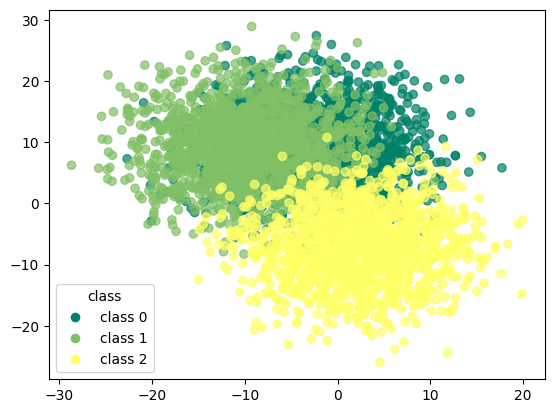

In [4854]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

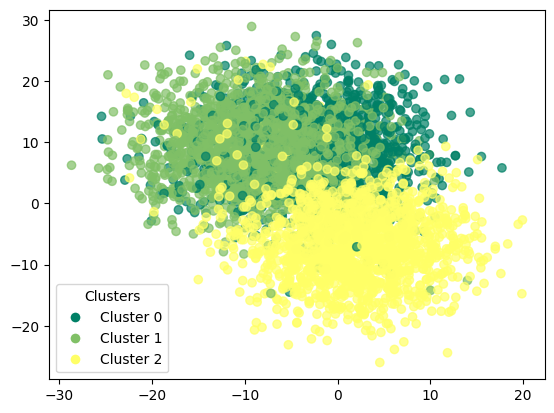

In [4855]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

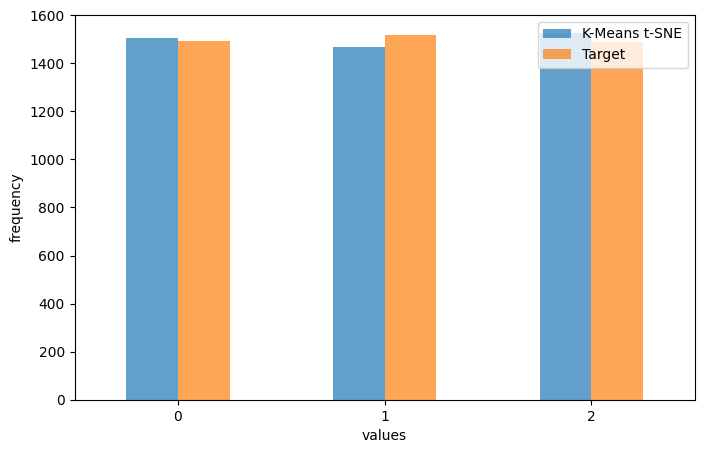

In [4856]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [4857]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[1328  149   14]
 [ 171 1309   38]
 [   5   10 1474]]


In [4858]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.88      0.89      0.89      1491
           1       0.89      0.86      0.88      1518
           2       0.97      0.99      0.98      1489

    accuracy                           0.91      4498
   macro avg       0.91      0.91      0.91      4498
weighted avg       0.91      0.91      0.91      4498



### trimmed k-means with umap

In [4859]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=3,trim_fraction=0.1)

In [4860]:
trim_kmeans_umap

KMeans(n_clusters=3, random_state=42)

In [4861]:
df_umap_trim_kmeans = corr_dataset.copy()

In [4862]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [4863]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [4864]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,trim_kmeans_umap
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
5,-7.498662,7.706682,11.383431,-0.300857,-7.194958,-6.836558,-20.051469,10.303901,5.827031,9.455212,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4865]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.035571365051133834
accuracy after: 0.9388617163183637


In [4866]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,trim_kmeans_umap
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
5,-7.498662,7.706682,11.383431,-0.300857,-7.194958,-6.836558,-20.051469,10.303901,5.827031,9.455212,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


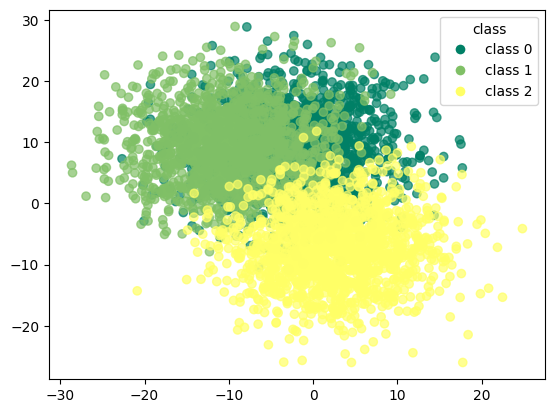

In [4867]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

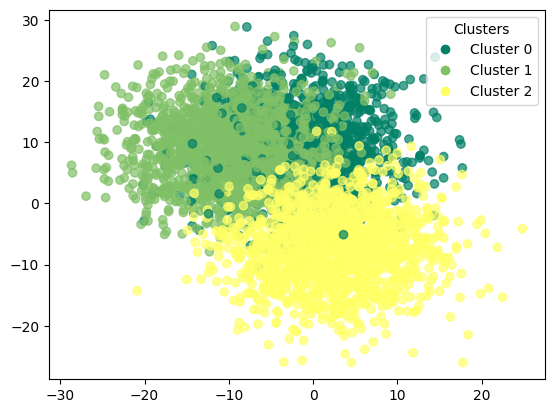

In [4868]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

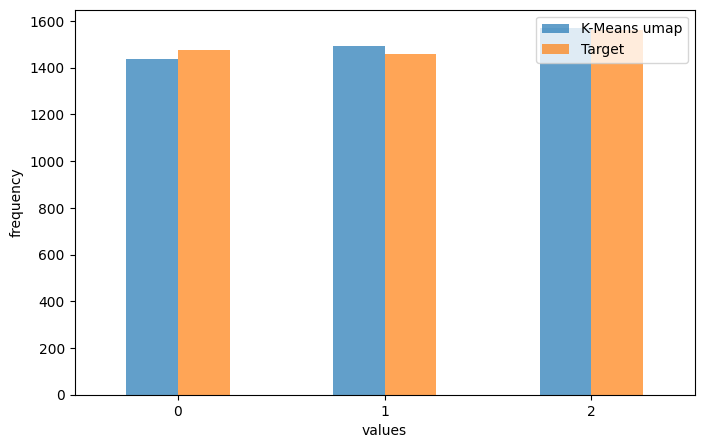

In [4869]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [4870]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[1330  142    5]
 [ 103 1343   14]
 [   4    7 1550]]


In [4871]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.93      0.90      0.91      1477
           1       0.90      0.92      0.91      1460
           2       0.99      0.99      0.99      1561

    accuracy                           0.94      4498
   macro avg       0.94      0.94      0.94      4498
weighted avg       0.94      0.94      0.94      4498



## dbscan

In [4872]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

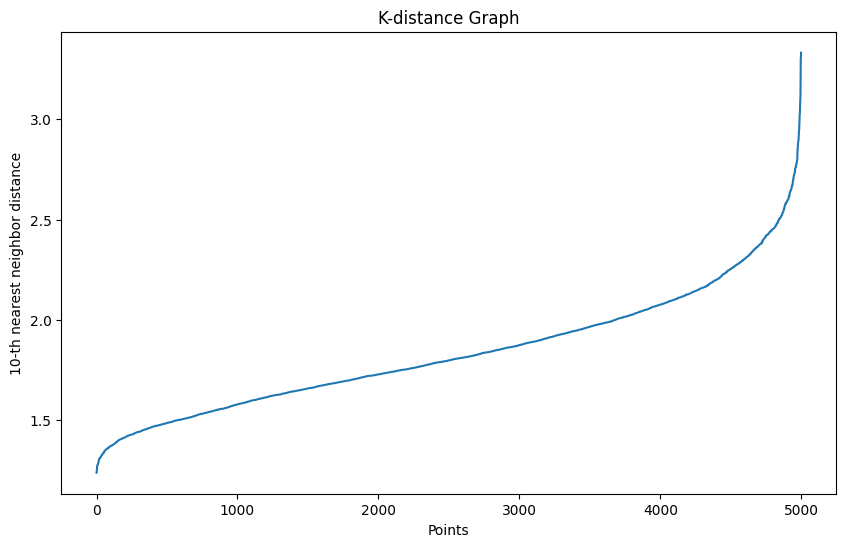

In [4873]:
plot_k_distance_graph(X_values,k=10) 

In [4874]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [4875]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [4876]:
df_dbscan = corr_dataset.copy()

In [4877]:
df_dbscan['dbscan'] = dbscan.labels_

In [4878]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [4879]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,dbscan
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,-1
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,-1
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,-1
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,-1
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,-1
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,-1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,-1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,-1


In [4880]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    4998
Name: count, dtype: int64


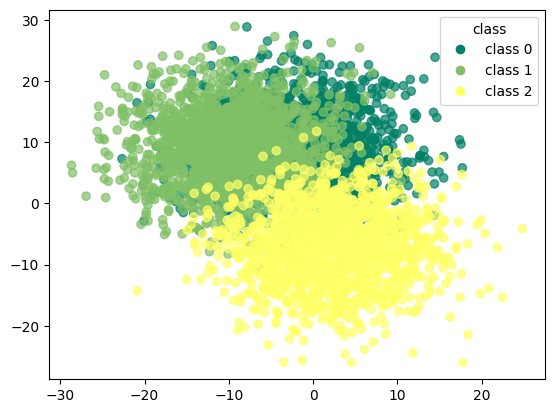

In [4881]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

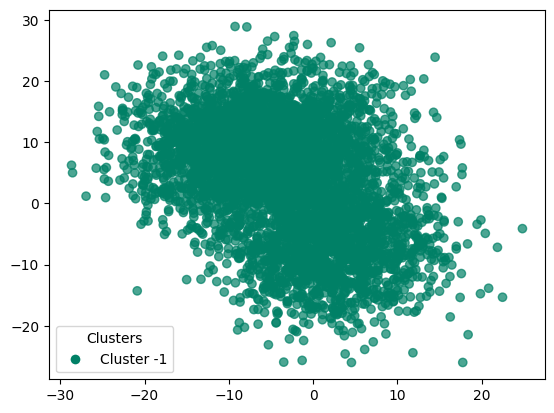

In [4882]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4883]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]]


In [4884]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1666.0
           1       0.00      0.00      0.00    1666.0
           2       0.00      0.00      0.00    1666.0

    accuracy                           0.00    4998.0
   macro avg       0.00      0.00      0.00    4998.0
weighted avg       0.00      0.00      0.00    4998.0



### dbscan with pca

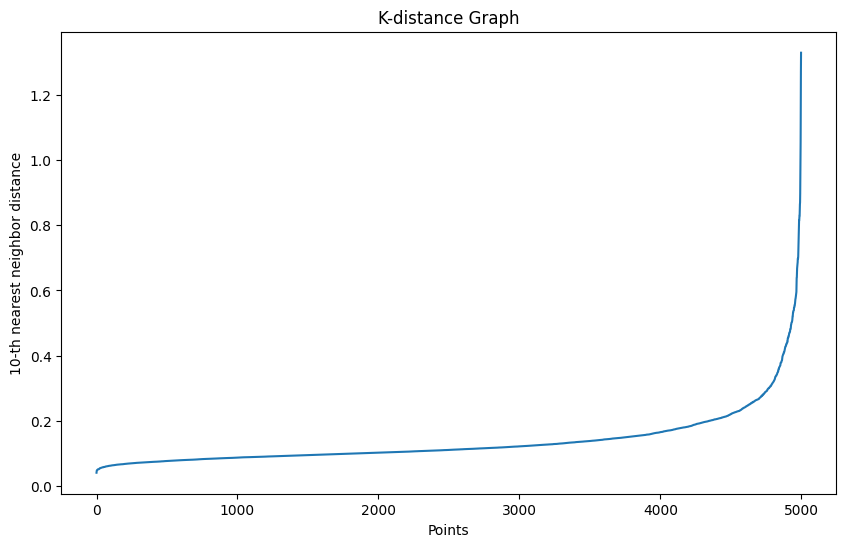

In [4885]:
plot_k_distance_graph(X_pca,k=10)

In [4886]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [4887]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [4888]:
df_pca_dbscan = corr_dataset.copy()

In [4889]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [4890]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.3291316526610644
accuracy after: 0.3321328531412565


In [4891]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,dbscan_pca
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,1
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,1
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,1
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,1
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,-1
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4892]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
 1    4950
-1      48
Name: count, dtype: int64


In [4893]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0]
 [  21    0 1645    0]
 [   6    0 1660    0]
 [  21    0 1645    0]]


In [4894]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1666
           1       0.34      1.00      0.50      1666
           2       0.00      0.00      0.00      1666

    accuracy                           0.33      4998
   macro avg       0.08      0.25      0.13      4998
weighted avg       0.11      0.33      0.17      4998



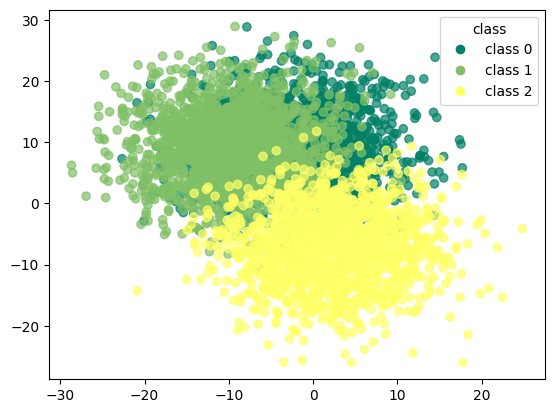

In [4895]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

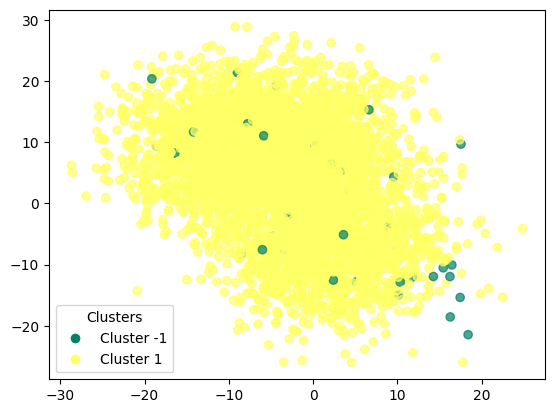

In [4896]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

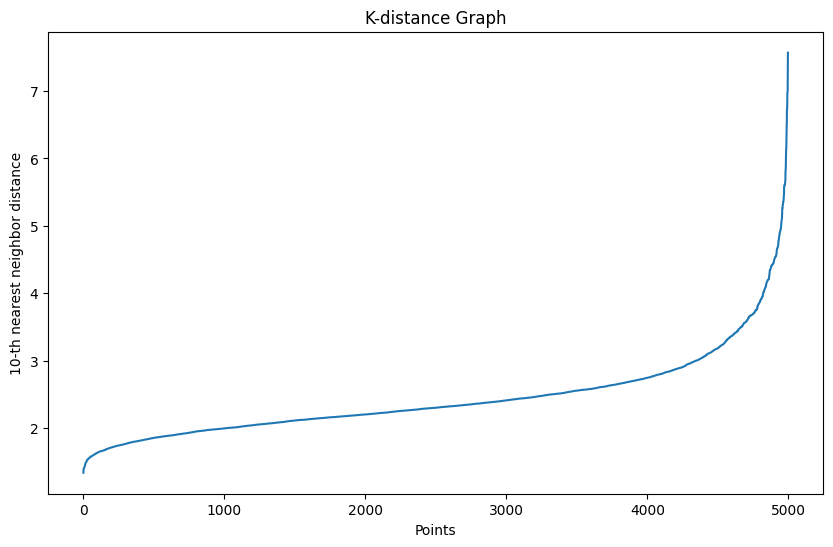

In [4897]:
plot_k_distance_graph(X_tsne,k=10)

In [4898]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [4899]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [4900]:
df_tsne_dbscan = corr_dataset.copy()

In [4901]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [4902]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.3165266106442577
accuracy after: 0.008803521408563426


In [4903]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,dbscan_tsne
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,-1
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,4
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,4
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,4


In [4904]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
 2    3147
 4    1574
-1     216
 1      32
 3      14
 5      10
 0       5
Name: count, dtype: int64


In [4905]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0    0    0    0]
 [  56    4   12 1567    7   17    3]
 [  69    1   15 1555    7   19    0]
 [  91    0    5   25    0 1538    7]
 [   0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0]]


In [4906]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.80      0.00      0.00      1666
           1       0.47      0.01      0.02      1666
           2       0.01      0.02      0.01      1666
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0

    accuracy                           0.01      4998
   macro avg       0.18      0.00      0.00      4998
weighted avg       0.43      0.01      0.01      4998



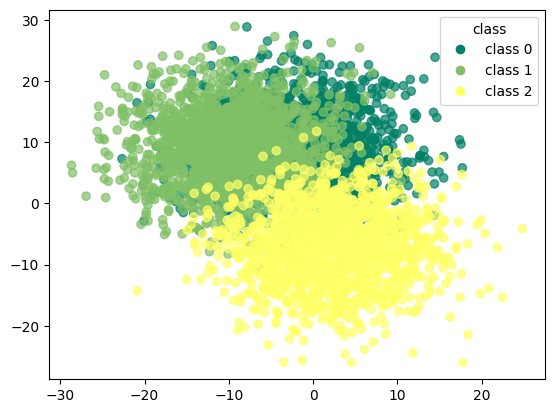

In [4907]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

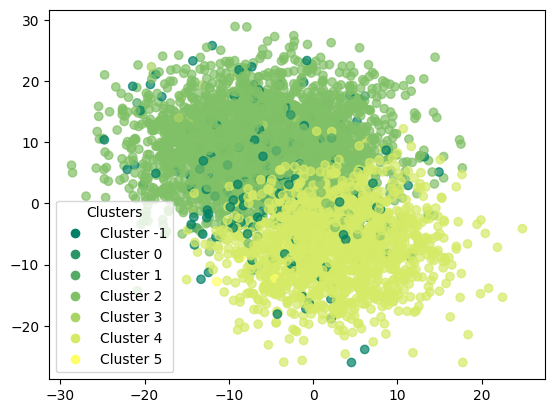

In [4908]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

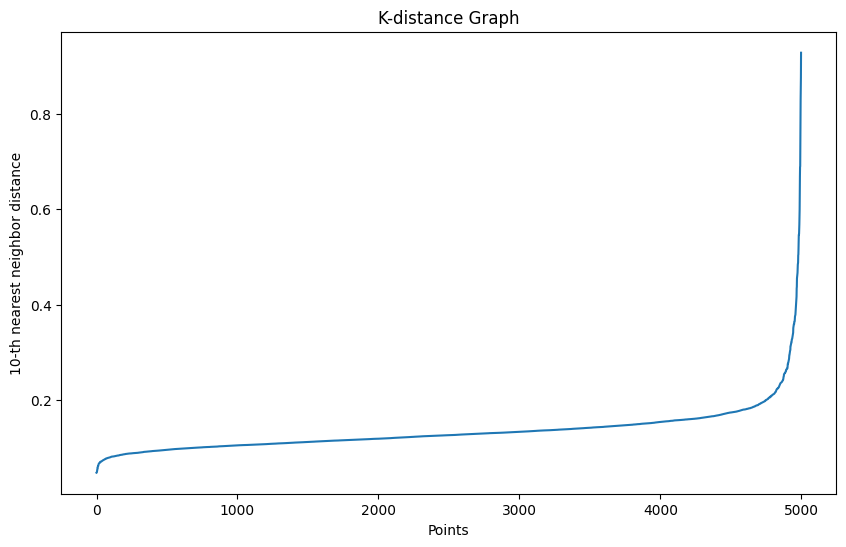

In [4909]:
plot_k_distance_graph(X_umap,k=10)

In [4910]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [4911]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [4912]:
df_umap_dbscan = corr_dataset.copy()

In [4913]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [4914]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 0.33433373349339734
accuracy after: 0.011204481792717087


In [4915]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,dbscan_umap
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4916]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
 2    3316
 1    1678
-1       4
Name: count, dtype: int64


In [4917]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[   0    0    0    0]
 [   0    0   20 1646]
 [   2    0   25 1639]
 [   2    0 1633   31]]


In [4918]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1666
           1       0.01      0.02      0.01      1666
           2       0.01      0.02      0.01      1666

    accuracy                           0.01      4998
   macro avg       0.01      0.01      0.01      4998
weighted avg       0.01      0.01      0.01      4998



## GMM - Gaussian Mixture Models

In [4919]:
gmm = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [4920]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [4921]:
df_gmm = corr_dataset.copy()

In [4922]:
df_gmm['gmm'] = gmm.predict(X_values)

In [4923]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,gmm
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,1
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4924]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.0430172068827531
accuracy after: 0.9227691076430572


In [4925]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,gmm
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


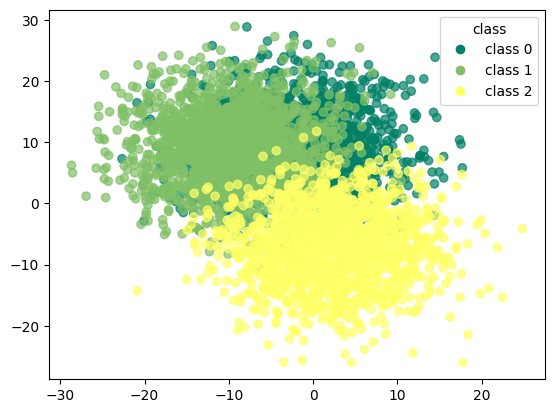

In [4926]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

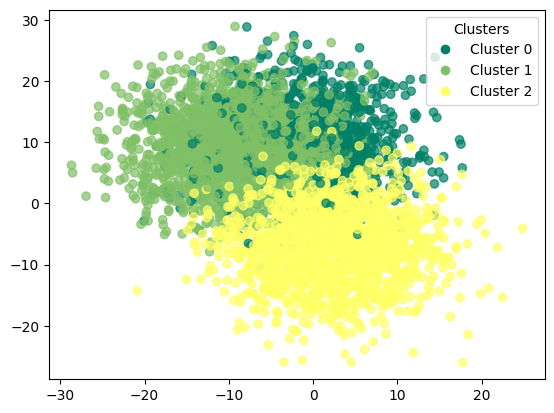

In [4927]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4928]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1474  181   11]
 [ 146 1500   20]
 [  14   14 1638]]


In [4929]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.90      0.88      0.89      1666
           1       0.88      0.90      0.89      1666
           2       0.98      0.98      0.98      1666

    accuracy                           0.92      4998
   macro avg       0.92      0.92      0.92      4998
weighted avg       0.92      0.92      0.92      4998



### GMM with pca

In [4930]:
gmm_pca = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [4931]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [4932]:
df_pca_gmm = corr_dataset.copy()

In [4933]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [4934]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,gmm_pca
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4935]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.03221288515406162
accuracy after: 0.907563025210084


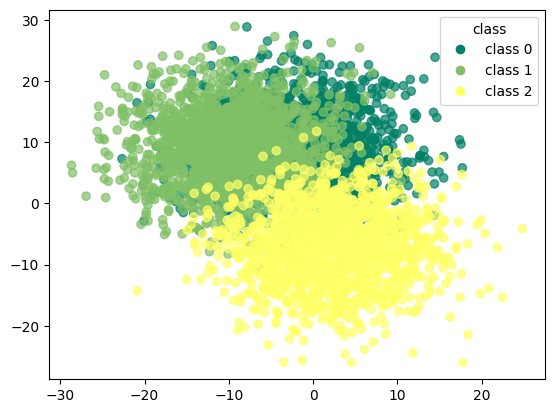

In [4936]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

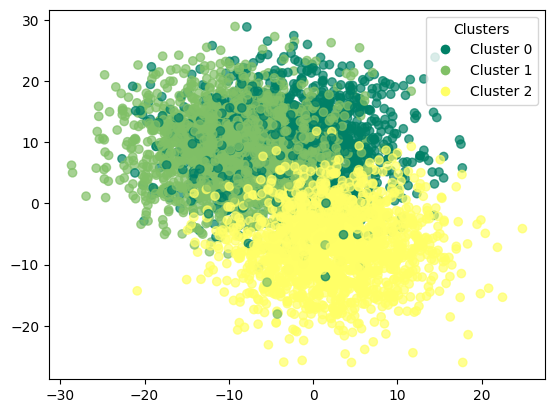

In [4937]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4938]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1539  118    9]
 [ 259 1385   22]
 [  21   33 1612]]


In [4939]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.85      0.92      0.88      1666
           1       0.90      0.83      0.87      1666
           2       0.98      0.97      0.97      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



### GMM with t-SNE

In [4940]:
gmm_tsne = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [4941]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [4942]:
df_tsne_gmm = corr_dataset.copy()

In [4943]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [4944]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,gmm_tsne
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4945]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.07462985194077632
accuracy after: 0.8939575830332133


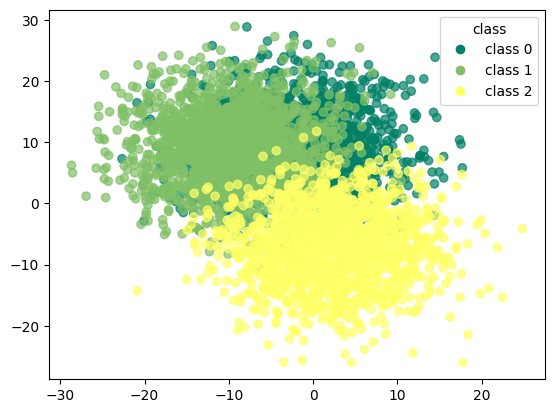

In [4946]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

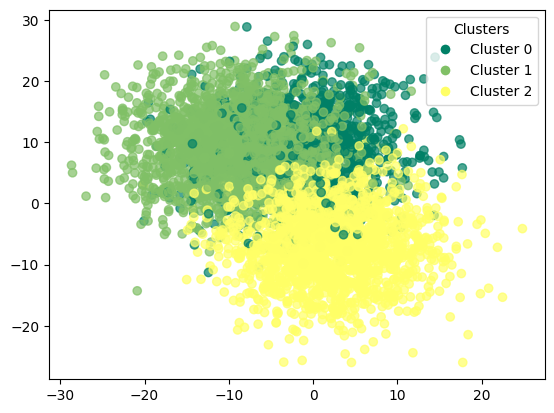

In [4947]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4948]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1333  313   20]
 [ 113 1523   30]
 [  30   24 1612]]


In [4949]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.90      0.80      0.85      1666
           1       0.82      0.91      0.86      1666
           2       0.97      0.97      0.97      1666

    accuracy                           0.89      4998
   macro avg       0.90      0.89      0.89      4998
weighted avg       0.90      0.89      0.89      4998



### GMM with umap

In [4950]:
gmm_umap = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [4951]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [4952]:
df_umap_gmm = corr_dataset.copy()

In [4953]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [4954]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,gmm_umap
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1


In [4955]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.06042416966786715
accuracy after: 0.9097639055622249


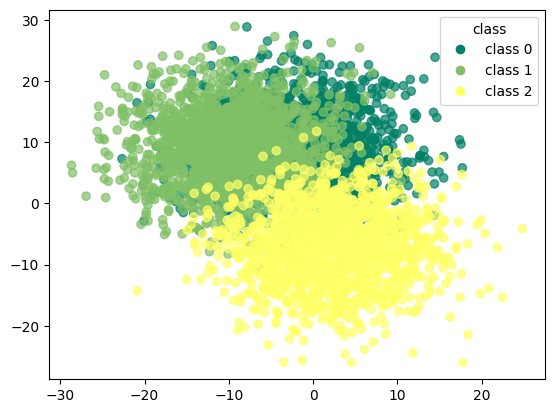

In [4956]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

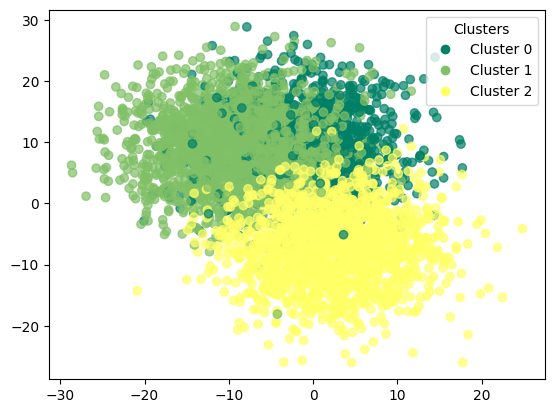

In [4957]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4958]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1375  271   20]
 [ 103 1539   24]
 [   7   26 1633]]


In [4959]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.93      0.83      0.87      1666
           1       0.84      0.92      0.88      1666
           2       0.97      0.98      0.98      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



## pam

In [4960]:
initial_medoids = np.random.choice(len(X_values),3,replace=False)

In [4961]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [4962]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [4963]:
pam.process()

In [4964]:
clusters = pam.get_clusters()

In [4965]:
medoids = pam.get_medoids()

In [4966]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [4967]:
df_pam = corr_dataset.copy()

In [4968]:
df_pam['pam'] = labels

In [4969]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,pam
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0.0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0.0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0.0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0.0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,1.0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,1.0
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,1.0
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,1.0


In [4970]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.29831932773109243
accuracy after: 0.8587434973989596


In [4971]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,pam
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


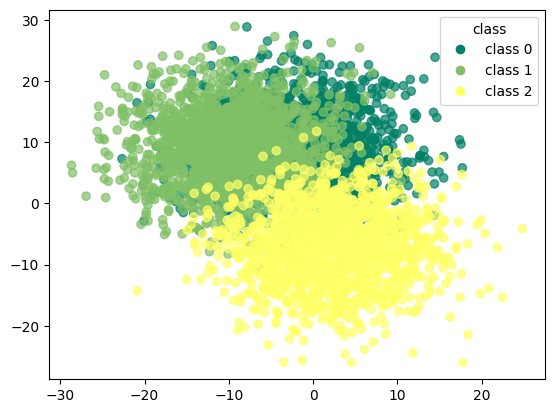

In [4972]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

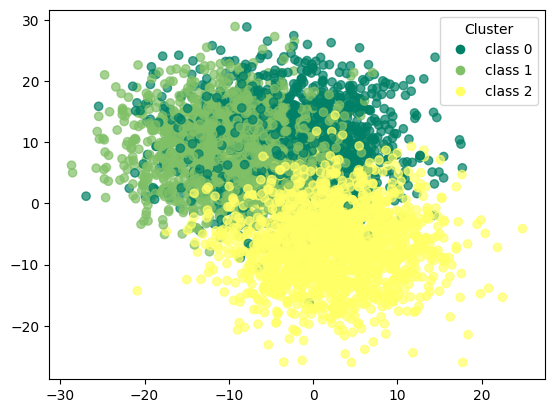

In [4973]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [4974]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1434  179   53]
 [ 406 1225   35]
 [  11   22 1633]]


In [4975]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.77      0.86      0.82      1666
           1       0.86      0.74      0.79      1666
           2       0.95      0.98      0.96      1666

    accuracy                           0.86      4998
   macro avg       0.86      0.86      0.86      4998
weighted avg       0.86      0.86      0.86      4998



### pam with pca

In [4976]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [4977]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [4978]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [4979]:
pam_pca.process()

In [4980]:
clusters = pam_pca.get_clusters()

In [4981]:
medoids = pam_pca.get_medoids()

In [4982]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [4983]:
df_pam_pca = corr_dataset.copy()

In [4984]:
df_pam_pca['pam_pca'] = labels

In [4985]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,pam_pca
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,1.0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,1.0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,1.0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,1.0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,1.0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,0.0
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,0.0
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,0.0


In [4986]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.04061624649859944
accuracy after: 0.9113645458183274


In [4987]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,pam_pca
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


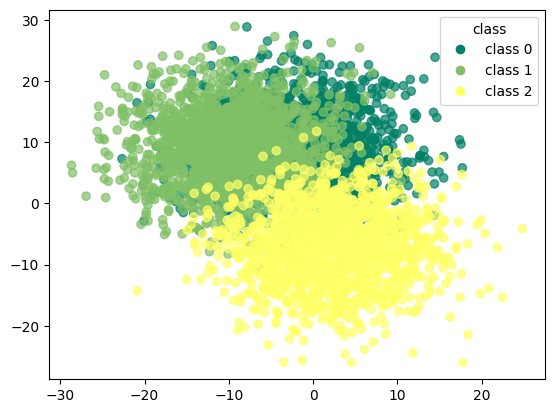

In [4988]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

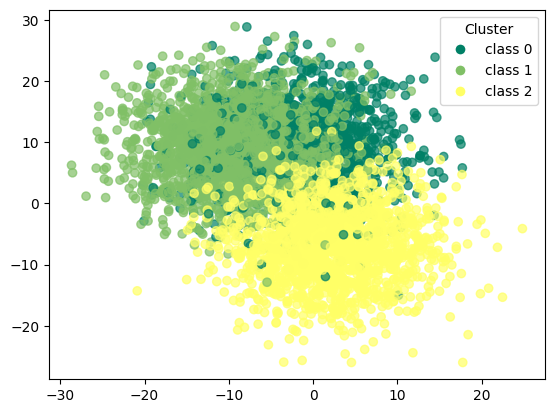

In [4989]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [4990]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1464  194    8]
 [ 166 1479   21]
 [  25   29 1612]]


In [4991]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.88      0.88      0.88      1666
           1       0.87      0.89      0.88      1666
           2       0.98      0.97      0.97      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



### pam with t-SNE

In [4992]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [4993]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [4994]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [4995]:
pam_tsne.process()

In [4996]:
clusters = pam_tsne.get_clusters()

In [4997]:
medoids = pam_tsne.get_medoids()

In [4998]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [4999]:
df_pam_tsne = corr_dataset.copy()

In [5000]:
df_pam_tsne['pam_tsne'] = labels

In [5001]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,pam_tsne
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2.0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2.0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2.0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2.0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2.0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,0.0
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,0.0
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,0.0


In [5002]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.29551820728291317
accuracy after: 0.9053621448579432


In [5003]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,pam_tsne
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


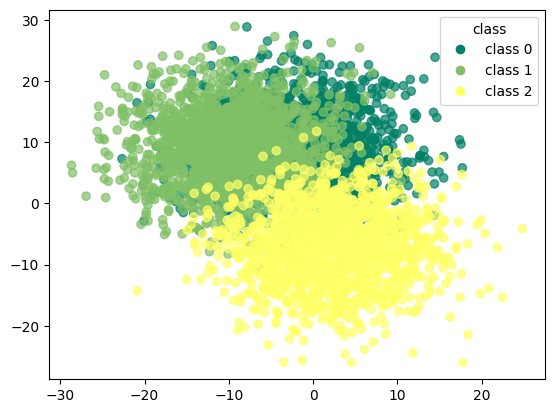

In [5004]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

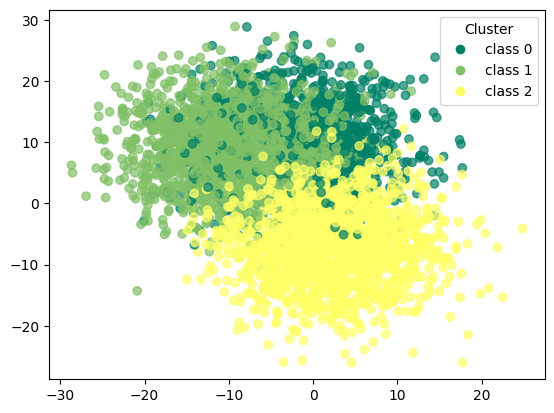

In [5005]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [5006]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1480  157   29]
 [ 209 1422   35]
 [  26   17 1623]]


In [5007]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      1666
           1       0.89      0.85      0.87      1666
           2       0.96      0.97      0.97      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



### pam with umap

In [5008]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [5009]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [5010]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [5011]:
pam_umap.process()

In [5012]:
clusters = pam_umap.get_clusters()

In [5013]:
medoids = pam_umap.get_medoids()

In [5014]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [5015]:
df_pam_umap = corr_dataset.copy()

In [5016]:
df_pam_umap['pam_umap'] = labels

In [5017]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,pam_umap
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,2.0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,2.0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,2.0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,2.0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,2.0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,0.0
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,0.0
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,0.0


In [5018]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.30692276910764305
accuracy after: 0.9135654261704682


In [5019]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,pam_umap
0,-2.604922,11.069571,9.921511,3.495760,-4.984572,-7.487015,-6.549138,6.784778,14.797323,8.749761,0,0
1,-1.341909,5.682400,2.157235,10.885218,-22.612463,-6.112223,-8.050255,12.139290,4.124127,11.935752,0,0
2,-2.413521,8.806458,9.132353,9.496475,-4.078610,-1.434137,-10.529148,7.878281,10.466406,6.013323,0,0
3,-1.596383,10.179681,11.376909,9.937956,-11.537366,-4.081878,-8.941264,5.709334,10.004717,1.145359,0,0
4,-6.655352,4.358197,3.137373,-2.373863,-12.856309,-12.896128,-14.691068,3.641995,3.579852,-8.613695,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4993,3.613273,-5.112318,-2.751670,-1.646836,0.720564,5.356199,-17.460683,18.322247,5.283155,2.069245,2,0
4994,2.720747,-3.110897,-14.236243,7.606482,8.536966,0.795406,-9.708048,-0.704937,4.173981,-11.105414,2,2
4995,7.138139,-5.710709,-2.745836,-2.138255,8.907501,11.967803,-6.774679,7.287588,-1.521478,-11.209949,2,2
4996,9.431076,-3.037970,-1.007864,-0.322936,9.632160,5.323450,-5.057680,8.901174,-4.264859,-11.156861,2,2


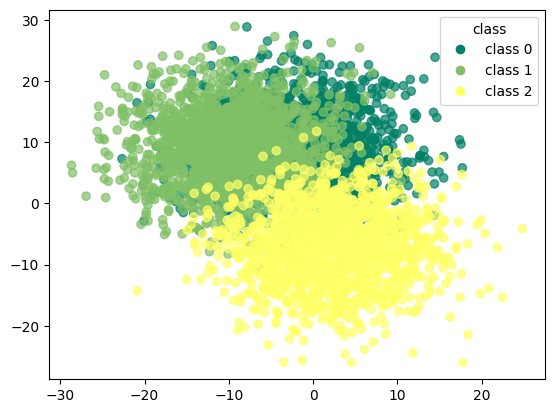

In [5020]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

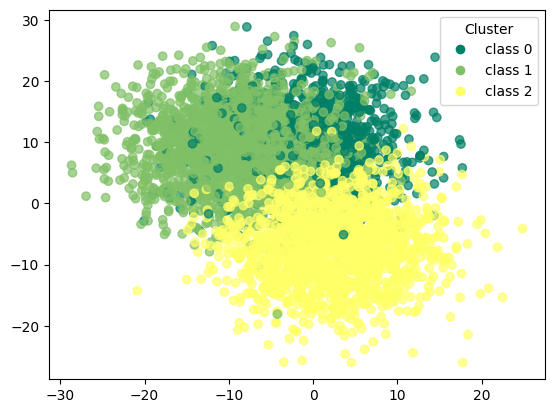

In [5021]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [5022]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1427  219   20]
 [ 134 1505   27]
 [   9   23 1634]]


In [5023]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.91      0.86      0.88      1666
           1       0.86      0.90      0.88      1666
           2       0.97      0.98      0.98      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



# overall results k-means

## basic

In [5024]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.89      0.89      0.89      1666
           1       0.88      0.89      0.88      1666
           2       0.98      0.97      0.98      1666

    accuracy                           0.92      4998
   macro avg       0.92      0.92      0.92      4998
weighted avg       0.92      0.92      0.92      4998



In [5025]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1480  178    8]
 [ 163 1483   20]
 [  24   25 1617]]


## + pca

In [5026]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.88      0.88      0.88      1666
           1       0.87      0.89      0.88      1666
           2       0.98      0.97      0.97      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



In [5027]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1465  193    8]
 [ 168 1477   21]
 [  26   29 1611]]


## + t-SNE

In [5028]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      1666
           1       0.89      0.85      0.87      1666
           2       0.96      0.97      0.97      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.90      4998
weighted avg       0.91      0.91      0.90      4998



In [5029]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1478  158   30]
 [ 208 1423   35]
 [  26   17 1623]]


## + UMAP

In [5030]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.90      0.86      0.88      1666
           1       0.86      0.89      0.88      1666
           2       0.97      0.98      0.98      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



In [5031]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[1432  214   20]
 [ 148 1491   27]
 [   9   23 1634]]


# overall results trimmed k-means

## basic

In [5032]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.88      0.89      0.89      1491
           1       0.89      0.89      0.89      1518
           2       0.98      0.98      0.98      1489

    accuracy                           0.92      4498
   macro avg       0.92      0.92      0.92      4498
weighted avg       0.92      0.92      0.92      4498



In [5033]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1326  158    7]
 [ 156 1345   17]
 [  17   15 1457]]


## + pca

In [5034]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.87      0.88      0.87      1491
           1       0.85      0.87      0.86      1518
           2       0.99      0.95      0.97      1489

    accuracy                           0.90      4498
   macro avg       0.90      0.90      0.90      4498
weighted avg       0.90      0.90      0.90      4498



In [5035]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1310  178    3]
 [ 188 1318   12]
 [  12   63 1414]]


## + t-SNE

In [5036]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.88      0.89      0.89      1491
           1       0.89      0.86      0.88      1518
           2       0.97      0.99      0.98      1489

    accuracy                           0.91      4498
   macro avg       0.91      0.91      0.91      4498
weighted avg       0.91      0.91      0.91      4498



In [5037]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[1328  149   14]
 [ 171 1309   38]
 [   5   10 1474]]


## + UMAP

In [5038]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.93      0.90      0.91      1477
           1       0.90      0.92      0.91      1460
           2       0.99      0.99      0.99      1561

    accuracy                           0.94      4498
   macro avg       0.94      0.94      0.94      4498
weighted avg       0.94      0.94      0.94      4498



In [5039]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[1330  142    5]
 [ 103 1343   14]
 [   4    7 1550]]


# overall results dbscan

## basic

In [5040]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1666.0
           1       0.00      0.00      0.00    1666.0
           2       0.00      0.00      0.00    1666.0

    accuracy                           0.00    4998.0
   macro avg       0.00      0.00      0.00    4998.0
weighted avg       0.00      0.00      0.00    4998.0



In [5041]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]]


## + pca

In [5042]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1666
           1       0.34      1.00      0.50      1666
           2       0.00      0.00      0.00      1666

    accuracy                           0.33      4998
   macro avg       0.08      0.25      0.13      4998
weighted avg       0.11      0.33      0.17      4998



In [5043]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0]
 [  21    0 1645    0]
 [   6    0 1660    0]
 [  21    0 1645    0]]


## + t-SNE

In [5044]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.80      0.00      0.00      1666
           1       0.47      0.01      0.02      1666
           2       0.01      0.02      0.01      1666
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0

    accuracy                           0.01      4998
   macro avg       0.18      0.00      0.00      4998
weighted avg       0.43      0.01      0.01      4998



In [5045]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0    0    0    0]
 [  56    4   12 1567    7   17    3]
 [  69    1   15 1555    7   19    0]
 [  91    0    5   25    0 1538    7]
 [   0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0]]


## + UMAP

In [5046]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1666
           1       0.01      0.02      0.01      1666
           2       0.01      0.02      0.01      1666

    accuracy                           0.01      4998
   macro avg       0.01      0.01      0.01      4998
weighted avg       0.01      0.01      0.01      4998



In [5047]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[   0    0    0    0]
 [   0    0   20 1646]
 [   2    0   25 1639]
 [   2    0 1633   31]]


# overall results GMM

## basic

In [5048]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.90      0.88      0.89      1666
           1       0.88      0.90      0.89      1666
           2       0.98      0.98      0.98      1666

    accuracy                           0.92      4998
   macro avg       0.92      0.92      0.92      4998
weighted avg       0.92      0.92      0.92      4998



In [5049]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1474  181   11]
 [ 146 1500   20]
 [  14   14 1638]]


## + pca

In [5050]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.85      0.92      0.88      1666
           1       0.90      0.83      0.87      1666
           2       0.98      0.97      0.97      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



In [5051]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1539  118    9]
 [ 259 1385   22]
 [  21   33 1612]]


## + t-SNE

In [5052]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.90      0.80      0.85      1666
           1       0.82      0.91      0.86      1666
           2       0.97      0.97      0.97      1666

    accuracy                           0.89      4998
   macro avg       0.90      0.89      0.89      4998
weighted avg       0.90      0.89      0.89      4998



In [5053]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1333  313   20]
 [ 113 1523   30]
 [  30   24 1612]]


## + UMAP

In [5054]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.93      0.83      0.87      1666
           1       0.84      0.92      0.88      1666
           2       0.97      0.98      0.98      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



In [5055]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1375  271   20]
 [ 103 1539   24]
 [   7   26 1633]]


# overall results pam

## basic

In [5056]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1434  179   53]
 [ 406 1225   35]
 [  11   22 1633]]


In [5057]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.77      0.86      0.82      1666
           1       0.86      0.74      0.79      1666
           2       0.95      0.98      0.96      1666

    accuracy                           0.86      4998
   macro avg       0.86      0.86      0.86      4998
weighted avg       0.86      0.86      0.86      4998



## + pca

In [5058]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1464  194    8]
 [ 166 1479   21]
 [  25   29 1612]]


In [5059]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.88      0.88      0.88      1666
           1       0.87      0.89      0.88      1666
           2       0.98      0.97      0.97      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



## + t-SNE

In [5060]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1480  157   29]
 [ 209 1422   35]
 [  26   17 1623]]


In [5061]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      1666
           1       0.89      0.85      0.87      1666
           2       0.96      0.97      0.97      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



## + umap

In [5062]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1427  219   20]
 [ 134 1505   27]
 [   9   23 1634]]


In [5063]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.91      0.86      0.88      1666
           1       0.86      0.90      0.88      1666
           2       0.97      0.98      0.98      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998

